In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scipy
import anndata as ad
import os
sc.settings.verbosity = 3
sc.logging.print_header()
sc.set_figure_params(dpi=100, dpi_save=600)

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/umap/d

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.11.1 pandas==1.3.5 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 louvain==0.8.0 pynndescent==0.5.10


# 读取数据

In [3]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE132465/"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_132465 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_132465.append(adata)
adata_132465= adata_list_132465[0].concatenate(adata_list_132465[1:],batch_categories= folders)
adata_132465.obs["sample"]=adata_132465.obs["batch"]
adata_132465.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_132465.var_names]
#在删除后一定要去重复
adata_132465.var_names_make_unique()
adata_132465
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 75515 × 36601
    obs: 'predicted_doublets', 'batch', 'sample'

In [4]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE144735/"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_144735 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_144735.append(adata)
adata_144735= adata_list_144735[0].concatenate(adata_list_144735[1:],batch_categories= folders)
adata_144735.obs["sample"]=adata_144735.obs["batch"]
adata_144735.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_144735.var_names]
#在删除后一定要去重复
adata_144735.var_names_make_unique()
adata_144735
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取

AnnData object with n_obs × n_vars = 8233 × 33694
    obs: 'predicted_doublets', 'batch', 'sample'

In [5]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE161277/"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_161277 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_161277.append(adata)
adata_161277= adata_list_161277[0].concatenate(adata_list_161277[1:],batch_categories= folders)
adata_161277.obs["sample"]=adata_161277.obs["batch"]
adata_161277.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_161277.var_names]
#在删除后一定要去重复
adata_161277.var_names_make_unique()
adata_161277
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取

AnnData object with n_obs × n_vars = 13830 × 33538
    obs: 'predicted_doublets', 'batch', 'sample'

In [6]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE178318_3MSS"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_178318 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_178318.append(adata)
adata_178318= adata_list_178318[0].concatenate(adata_list_178318[1:],batch_categories= folders)
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取
adata_178318.obs["sample"]=adata_178318.obs["batch"]
adata_178318.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_178318.var_names]
#在删除后一定要去重复
adata_178318.var_names_make_unique()
adata_178318

AnnData object with n_obs × n_vars = 37910 × 36601
    obs: 'predicted_doublets', 'batch', 'sample'

In [41]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE200997"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_200997 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_200997.append(adata)
adata_200997= adata_list_200997[0].concatenate(adata_list_200997[1:],batch_categories= folders)
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取
adata_200997.obs["sample"]=adata_200997.obs["batch"]
adata_200997.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_200997.var_names]
#在删除后一定要去重复
adata_200997.var_names_make_unique()
adata_200997

AnnData object with n_obs × n_vars = 27751 × 23828
    obs: 'predicted_doublets', 'batch', 'sample'

In [40]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE221575"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_221575 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_221575.append(adata)
adata_221575= adata_list_221575[0].concatenate(adata_list_221575[1:],batch_categories= folders)
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取
adata_221575.obs["sample"]=adata_221575.obs["batch"]
adata_221575.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_221575.var_names]
#在删除后一定要去重复
adata_221575.var_names_make_unique()
adata_221575

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 8037 × 26150
    obs: 'predicted_doublets', 'batch', 'sample'

In [8]:
folder_path = "/mnt/g/E-disk/ZJH_KRAS/Datadir/GSE231559"
# 获取所有待处理的文件夹名称 
folders = [f for f in os.listdir(folder_path)]
folders
adata_list_231559 = []
for folder in folders:
    h5ad_path = os.path.join(folder_path,folder,"raw_after_Scrublet.h5ad")
    adata = sc.read_h5ad(h5ad_path)
    adata_list_231559.append(adata)
adata_231559= adata_list_231559[0].concatenate(adata_list_231559[1:],batch_categories= folders)
#因为之前所有转化为raw_after_Scrublet.h5ad，所以直接读取
adata_231559.obs["sample"]=adata_231559.obs["batch"]
adata_231559.var_names = [name.split('\t')[1] if '\t' in name else name for name in adata_231559.var_names]
#在删除后一定要去重复
adata_231559.var_names_make_unique()
adata_231559

AnnData object with n_obs × n_vars = 29303 × 33538
    obs: 'predicted_doublets', 'batch', 'sample'

In [42]:
adata_list = [
    adata_132465,
    adata_144735,
    adata_161277,
    adata_200997,
    adata_221575,
    adata_231559
]

In [43]:
adata_merged=adata_list[0].concatenate(adata_list[1:],batch_categories=["GSE132465",
"GSE144735",
"GSE161277",
"GSE200997",
"GSE221575",                                                                      
"GSE231559"                                                                       
])
adata_merged

AnnData object with n_obs × n_vars = 162669 × 16358
    obs: 'predicted_doublets', 'batch', 'sample'

# name

In [13]:
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/2.Scanpy/ZJH_KRAS_all_"

In [45]:
adata_merged.write(name+"merge_raw.h5ad",compression='gzip')

In [46]:
adata=adata_merged
adata

AnnData object with n_obs × n_vars = 162669 × 16358
    obs: 'predicted_doublets', 'batch', 'sample'

# 基本分析

filtered out 9840 cells that have less than 200 genes expressed


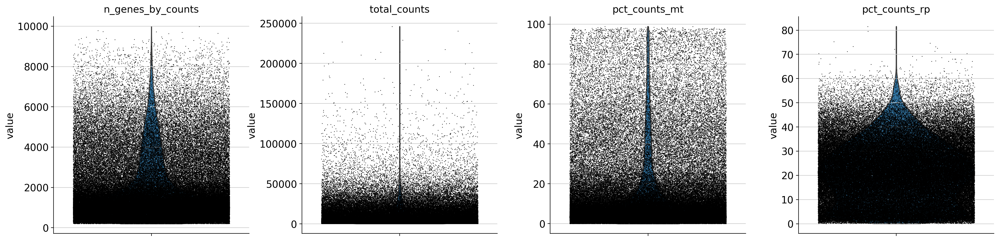

In [47]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3) #过滤太多基因会导致raw矩阵很多标记基因找不到
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['rp'] = adata.var_names.str.startswith('RPL') | adata.var_names.str.startswith('RPS')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','rp'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, keys=['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_rp'], jitter=0.4, multi_panel=True,save='_QC.pdf') #根据小提琴图做质控

In [48]:
adata = adata[adata.obs.n_genes_by_counts < 8000, :] #这个需要小提琴图
adata = adata[adata.obs.pct_counts_mt < 50, :] #线粒体比例小于20
adata = adata[adata.obs.pct_counts_rp < 50, :] #核糖体比例小于50
adata

View of AnnData object with n_obs × n_vars = 138739 × 16358
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [49]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:01)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


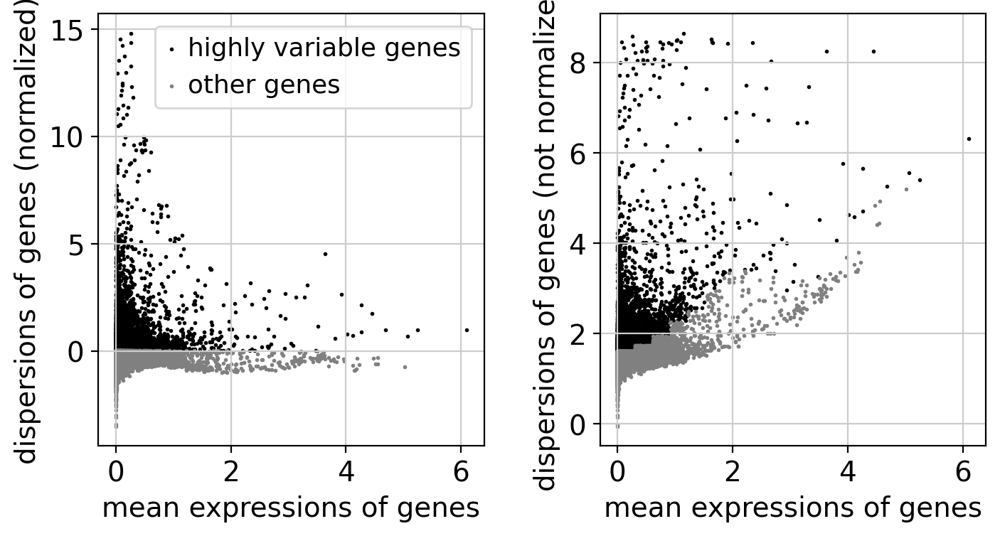

5000
regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_rp']
    sparse input is densified and may lead to high memory use
    finished (0:02:11)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:34)


2024-12-25 09:40:27,633 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-12-25 09:42:09,067 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-12-25 09:42:10,340 - harmonypy - INFO - Iteration 1 of 10
2024-12-25 09:45:57,811 - harmonypy - INFO - Iteration 2 of 10
2024-12-25 09:49:42,177 - harmonypy - INFO - Iteration 3 of 10
2024-12-25 09:53:28,191 - harmonypy - INFO - Iteration 4 of 10
2024-12-25 09:57:13,557 - harmonypy - INFO - Iteration 5 of 10
2024-12-25 10:00:58,967 - harmonypy - INFO - Iteration 6 of 10
2024-12-25 10:04:41,983 - harmonypy - INFO - Iteration 7 of 10
2024-12-25 10:07:32,071 - harmonypy - INFO - Iteration 8 of 10
2024-12-25 10:09:52,518 - harmonypy - INFO - Iteration 9 of 10
2024-12-25 10:12:03,256 - harmonypy - INFO - Iteration 10 of 10
2024-12-25 10:14:04,773 - harmonypy - INFO - Stopped before convergence


In [50]:
sc.pp.highly_variable_genes(adata, n_top_genes=5000) #取5000个差异基因
sc.pl.highly_variable_genes(adata)
print(sum(adata.var.highly_variable))
adata.raw=adata #记录原始矩阵
adata = adata[:, adata.var.highly_variable]
sc.pp.regress_out(adata, keys=['total_counts', 'pct_counts_mt','pct_counts_rp'], n_jobs=16)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sce.pp.harmony_integrate(adata, key='sample', basis='X_pca', adjusted_basis='X_pca_harmony')
adata.obsm['X_pca']=adata.obsm['X_pca_harmony']

In [51]:
number=20241225 #随机种子
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50, knn=True,random_state=number)
sc.tl.leiden(adata, resolution=1.2,random_state=number)
sc.tl.umap(adata, random_state=number)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:21)
running Leiden clustering
    finished: found 39 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:05:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:24)


# 定位name

In [50]:
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/2.Scanpy/ZJH_KRAS_all_"

In [53]:
adata.write(name+"after_umap.h5ad",compression='gzip')

In [17]:
adata=sc.read(name+"after_umap.h5ad")
adata

AnnData object with n_obs × n_vars = 190870 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'MSI_status', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [54]:
import pandas as pd

# Assuming 'adata' is your AnnData object
# Define a dictionary to map batch to Cluster mutation status
Cluster = {
    'GSM7290763': 'Wildtype',
    'GSM7290769': 'Wildtype',
    'GSM7290772': 'Mutant',
    'GSM7290774': 'Mutant',
    'GSM7290777': 'Mutant',
    'GSM6886537': 'Mutant',
    'GSM6886539': 'Mutant',
    'T_CAC1': 'Mutant',
    'T_CAC2': 'Mutant',
    'T_CAC3': 'Wildtype',
    'T_CAC4': 'Wildtype',
    'T_CAC5': 'Mutant',
    'T_CAC6': 'Wildtype',
    'T_CAC7': 'Wildtype',
    'T_CAC8': 'Mutant',
    'T_CAC9': 'Wildtype',
    'T_CAC10': 'Wildtype',
    'T_CAC11': 'Wildtype',
    'T_CAC12': 'Mutant',
    'T_CAC13': 'Mutant',
    'T_CAC14': 'Mutant',
    'T_CAC16': 'Wildtype',
    'GSM4904236': 'Mutant',
    'GSM4904239': 'Wildtype',
    'GSM4904245': 'Mutant',
    'SMC01_T': 'Mutant',
    'SMC02_T': 'Wildtype',
    'SMC03_T': 'Wildtype',
    'SMC04_T': 'Mutant',
    'SMC05_T': 'Mutant',
    'SMC06_T': 'Mutant',
    'SMC07_T': 'Mutant',
    'SMC08_T': 'Wildtype',
    'SMC09_T': 'Wildtype',
    'SMC10_T': 'Wildtype',
    'SMC11_T': 'Wildtype',
    'SMC14_T': 'Mutant',
    'SMC15_T': 'Wildtype',
    'SMC16_T': 'Wildtype',
    'SMC17_T': 'Wildtype',
    'SMC18_T': 'Wildtype',
    'SMC19_T': 'Mutant',
    'SMC20_T': 'Mutant',
    'SMC21_T': 'Wildtype',
    'SMC22_T': 'Wildtype',
    'SMC23_T': 'Mutant',
    'SMC24_T': 'Mutant',
    'SMC25_T': 'Wildtype',
    'KUL01_T': 'Wildtype',
    'KUL19_T': 'Wildtype',
    'KUL21_T': 'Mutant',
    'KUL28_T': 'Wildtype',
    'KUL30_T': 'Mutant',
    'KUL31_T': 'Mutant'
}

# Map the Cluster mutation status to the 'batch' column and assign it to a new column 'KRAS'
adata.obs['KRAS'] = adata.obs['sample'].map(Cluster)
adata.obs['KRAS']

AAACCTGAGAAGGTTT-1-SMC01_T-GSE132465       Mutant
AAACCTGAGGTAGCTG-1-SMC01_T-GSE132465       Mutant
AAACCTGCATACGCCG-1-SMC01_T-GSE132465       Mutant
AAACCTGGTCATATCG-1-SMC01_T-GSE132465       Mutant
AAACCTGGTCCAGTAT-1-SMC01_T-GSE132465       Mutant
                                            ...  
TTTGTTGAGAGTAACT-1-GSM7290777-GSE231559    Mutant
TTTGTTGAGCCTCACG-1-GSM7290777-GSE231559    Mutant
TTTGTTGGTGTCCGGT-1-GSM7290777-GSE231559    Mutant
TTTGTTGTCTCGACCT-1-GSM7290777-GSE231559    Mutant
TTTGTTGTCTGGGCCA-1-GSM7290777-GSE231559    Mutant
Name: KRAS, Length: 138739, dtype: object

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


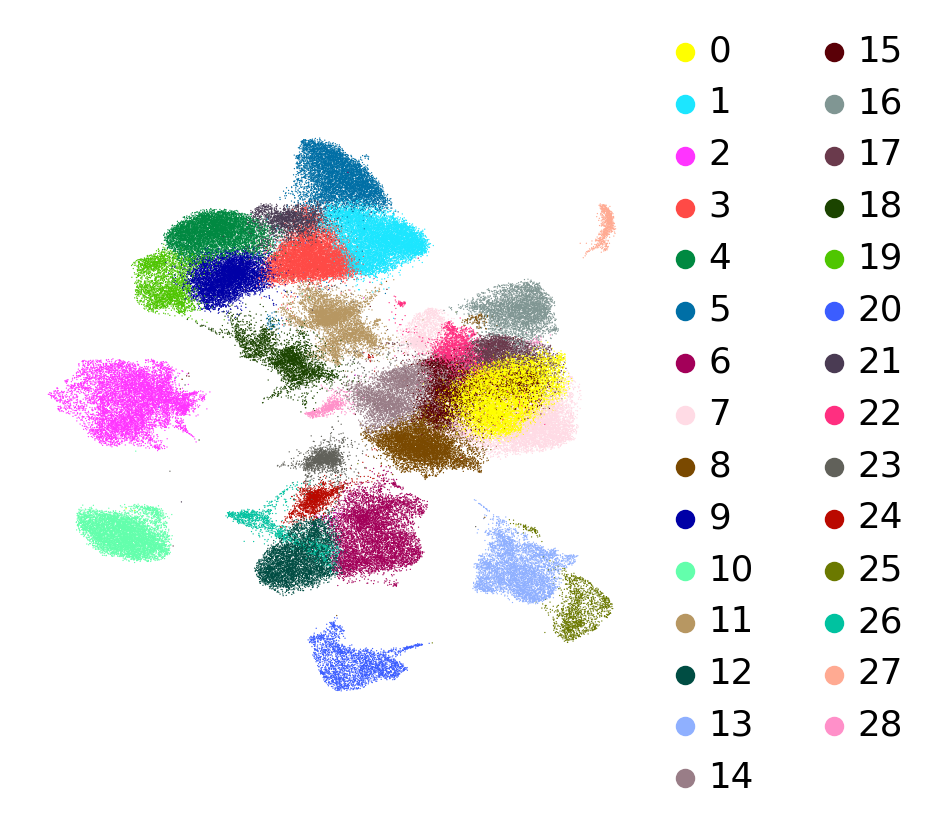

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


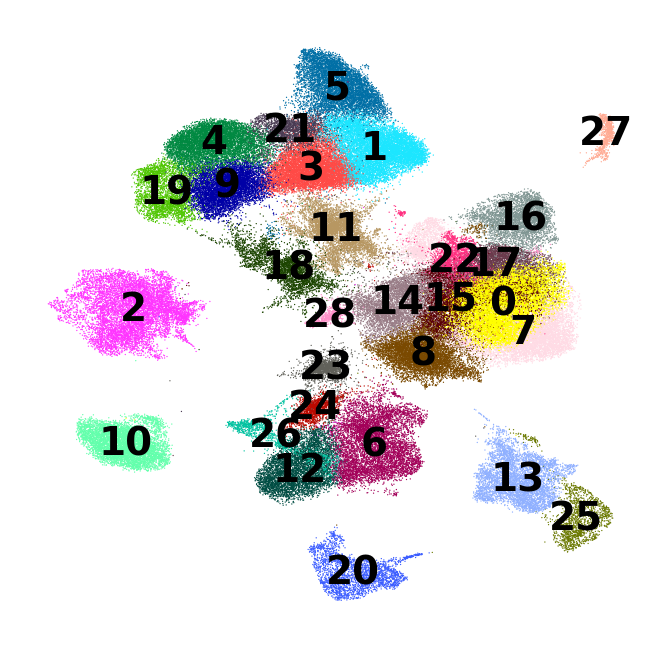

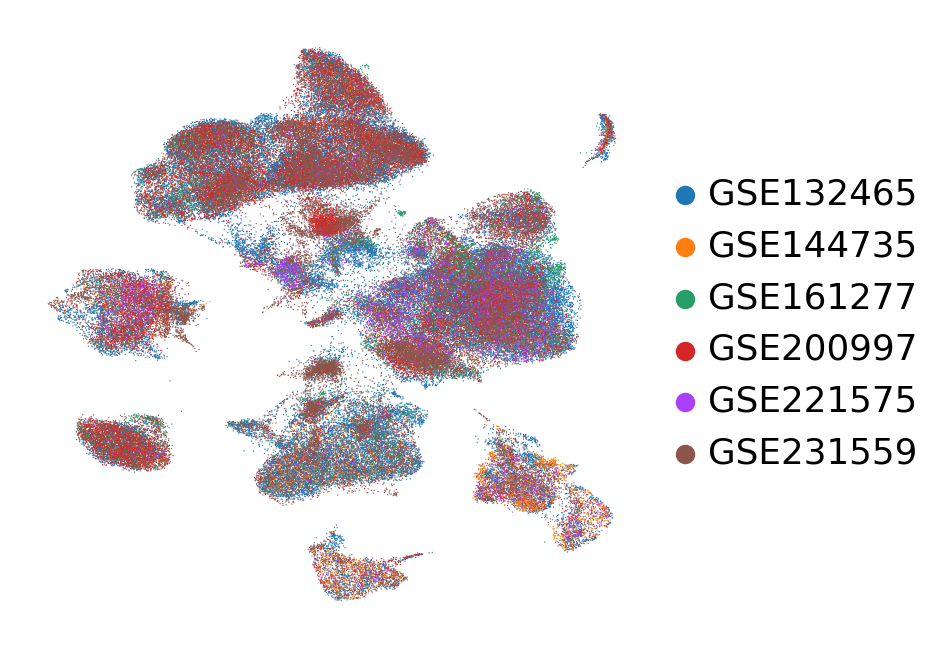

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


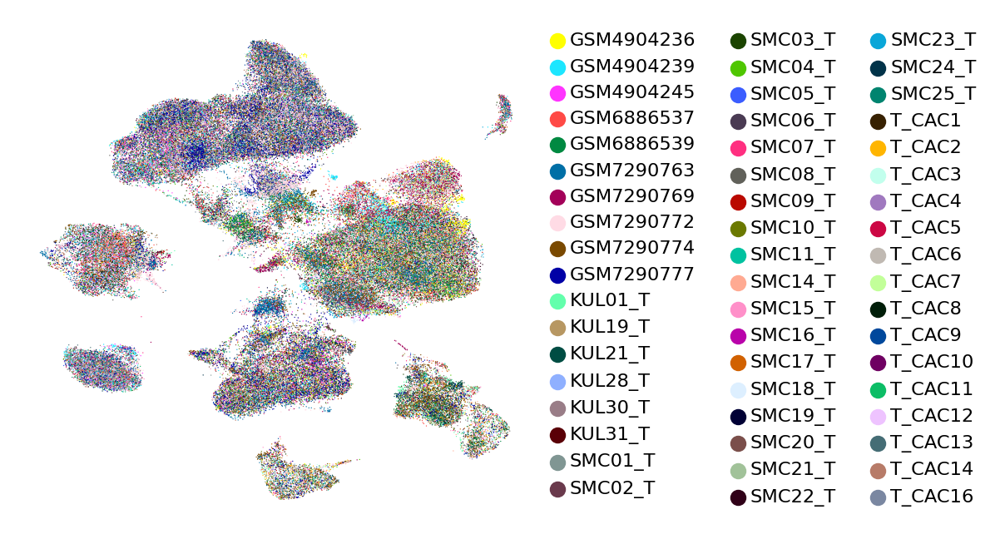

In [58]:
sc.pl.umap(adata,color=['leiden'], legend_loc='right margin', frameon=False, title='', use_raw=True ,save='_leiden.pdf')
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)
sc.pl.umap(adata,color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='_batch.pdf')
sc.pl.umap(adata, color=['sample'], legend_loc='right margin', frameon=False, title='', use_raw=True,save='_all_sample.pdf', legend_fontsize='xx-small') #如果样本太多把字缩到最小

In [57]:
valid_numbers = [str(x) for x in range(29)]
print(valid_numbers)
adata=adata[adata.obs['leiden'].isin(valid_numbers)]
adata

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28']


View of AnnData object with n_obs × n_vars = 136890 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'sample_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


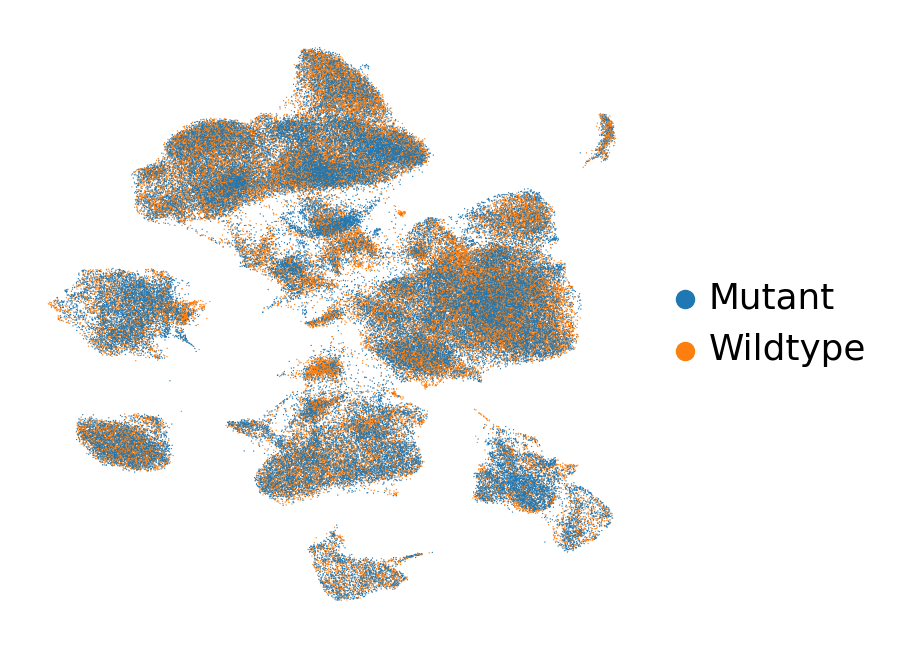

In [59]:
sc.pl.umap(adata,color=['KRAS'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='_Cluster.pdf')

# 注释细胞

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


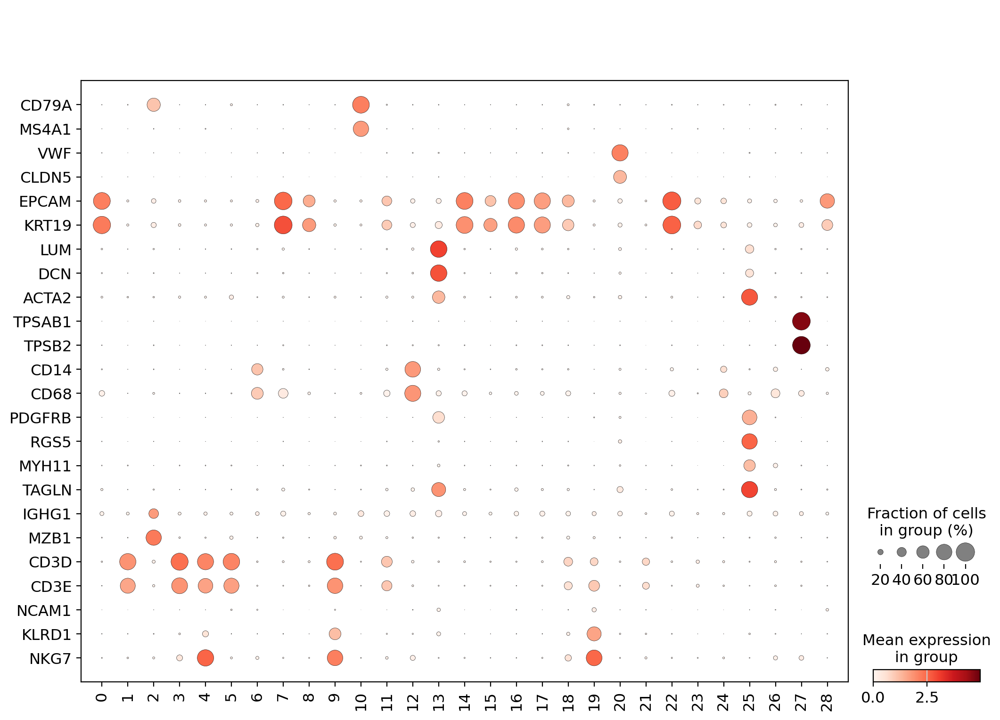

In [4]:
markers = ['CD79A', 'MS4A1', # B_cells
           'VWF','CLDN5', # Endothelial_cells
           'EPCAM', 'KRT19', # Epithelial_cells
           'LUM', 'DCN', 'ACTA2', # Fibroblasts
           'TPSAB1', 'TPSB2', # Mast_cells
           'CD14','CD68',#Myeloid_cells
           'PDGFRB', 'RGS5','MYH11',"TAGLN", # Pericytes & SMCs
           'IGHG1', 'MZB1', # Plasma_cells
           'CD3D', 'CD3E','NCAM1', 'KLRD1', 'NKG7'#T&NK_cells
          ]
sc.pl.dotplot(adata, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=True, dot_min=0,save='allleiden.pdf')

In [33]:
from io import StringIO
flatten = lambda nest_list: sum(([x] if not isinstance(x, list) else flatten(x) for x in nest_list), [])
def label_helper(number_of_cluster: int):
  _s1 = ",\n".join([str(i) for i in range(number_of_cluster+1)])
  _s2 = "\nnew_cluster_names ='''\n" + _s1 + ",\n'''\n"
  print(_s2)
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'Celltype', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

In [34]:
label_helper(29)
new_cluster_names ='''
0,Epithelial_cells
1,T & NK_cells
2,Plasma_cells
3,T & NK_cells
4,T & NK_cells
5,T & NK_cells
6,Myeloid_cells
7,Epithelial_cells
8,Epithelial_cells
9,T & NK_cells
10,B_cells
11,T & NK_cells
12,Myeloid_cells
13,Fibroblasts
14,Epithelial_cells
15,Epithelial_cells
16,Epithelial_cells
17,Epithelial_cells
18,T & NK_cells
19,T & NK_cells
20,Endothelial_cells
21,T & NK_cells
22,Epithelial_cells
23,Epithelial_cells
24,Myeloid_cells
25,Pericytes & SMCs
26,Myeloid_cells
27,Mast_cells
28,Epithelial_cells
'''


new_cluster_names ='''
0,
1,
2,
3,
4,
5,
6,
7,
8,
9,
10,
11,
12,
13,
14,
15,
16,
17,
18,
19,
20,
21,
22,
23,
24,
25,
26,
27,
28,
29,
'''



/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


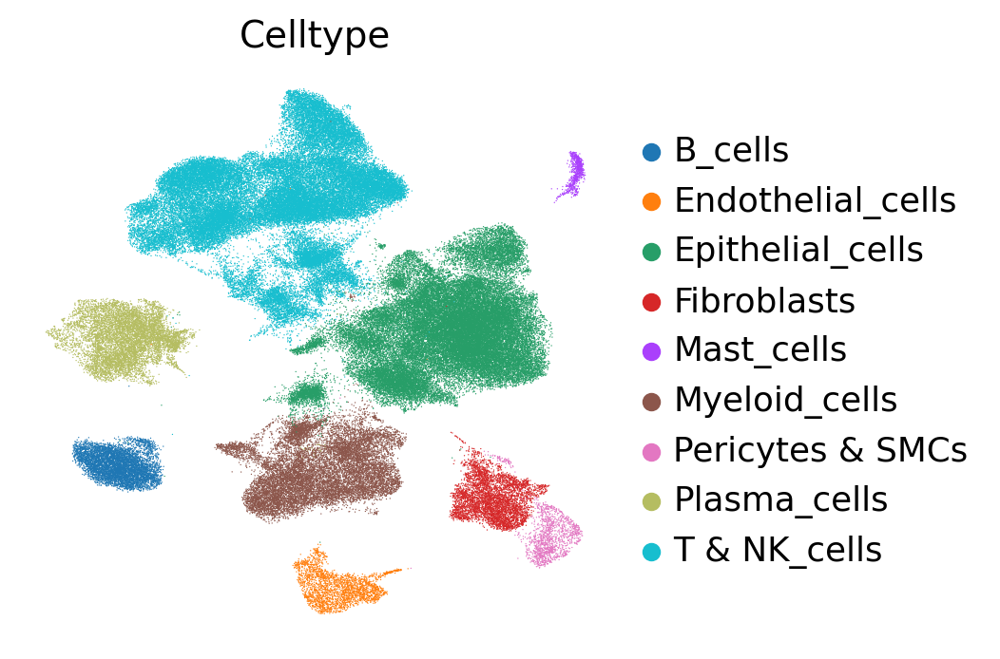

In [35]:
labeled(adata,cluster_names=new_cluster_names,reference_key='leiden',cell_type_key='Celltype')
sc.pl.umap(adata,color='Celltype',frameon=False, add_outline=False,save='_Celltype_total2.pdf')

In [ ]:
#保存
adata.write(name+"after_celltype2.h5ad",compression='gzip')

# 分组展示UMAP

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


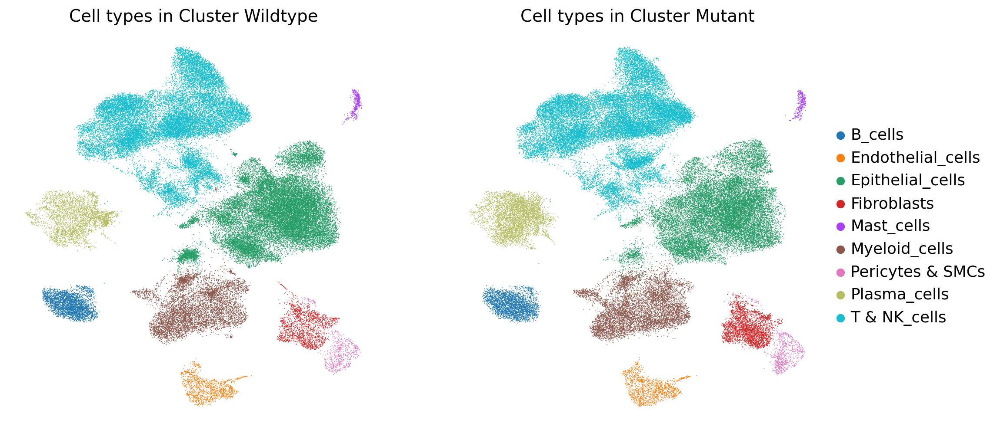

In [10]:
import scanpy as sc
import matplotlib.pyplot as plt
adata_con = adata[adata.obs['KRAS'] == 'Wildtype']
adata_exp = adata[adata.obs['KRAS'] == 'Mutant']
#创建一个画板分为两个轴
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
sc.pl.umap(adata_con, color=['Celltype'],
           legend_loc='', frameon=False, add_outline=False, use_raw=True, ax=ax1, show=False,title='Cell types in Cluster Wildtype')

sc.pl.umap(adata_exp, color=['Celltype'],
           legend_loc='right margin', frameon=False, add_outline=False, use_raw=True, ax=ax2, show=False,title='Cell types in Cluster Mutant')
# 保存图片,bbox_inches='tight' 用于在保存图像时自动调整边界框以确保图像的所有内容都包含在内。
plt.savefig(name+"combined_umap.pdf", dpi=300, bbox_inches='tight')
plt.show()

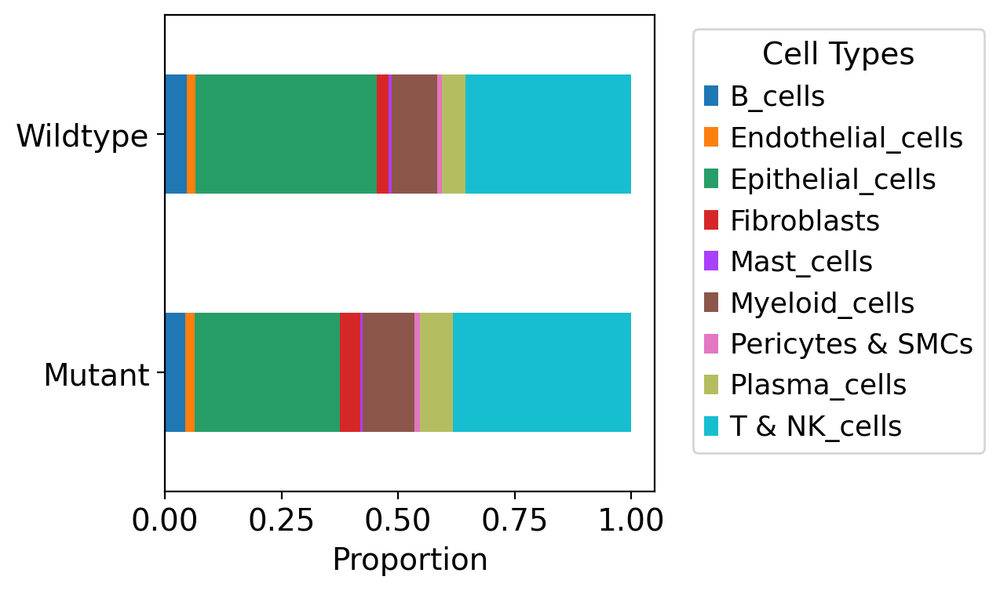

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_stro提取数据
Group = adata.obs['KRAS']
Celltype = adata.obs['Celltype']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'Celltype': Celltype})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'Celltype']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)   #h去掉就是垂直的
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)
# 显示图形
plt.savefig(name+'allcellproportion.pdf', dpi=300, bbox_inches='tight')
plt.show()
# 导出比例到Excel
excel_filename = name + "all_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
grouped_ratios.to_csv(name + "all_cellproportion.csv") #用于柱状图

# Fib细胞分类

In [106]:
adata_fib=adata[adata.obs['Celltype'].isin(['Fibroblasts'])]
adata_fib

View of AnnData object with n_obs × n_vars = 4859 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'sample_colors', 'KRAS_colors', 'Celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [113]:
number=122696
sc.pp.neighbors(adata_fib, n_neighbors=15, n_pcs=40, knn=True,random_state=number)
sc.tl.leiden(adata_fib, resolution=0.3,random_state=number)
sc.tl.umap(adata_fib,random_state=number)
adata_fib

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


AnnData object with n_obs × n_vars = 4859 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'sample_colors', 'KRAS_colors', 'Celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## fib亚群注释

In [9]:
new_stro_names ='''
0,Fib_CTHRC1
1,Fib_GAL
2,Fib_CXCL14
3,Fib_IGF1
4,Fib_MMP1
5,Fib_PRKG1
'''

In [10]:
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'Celltype', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


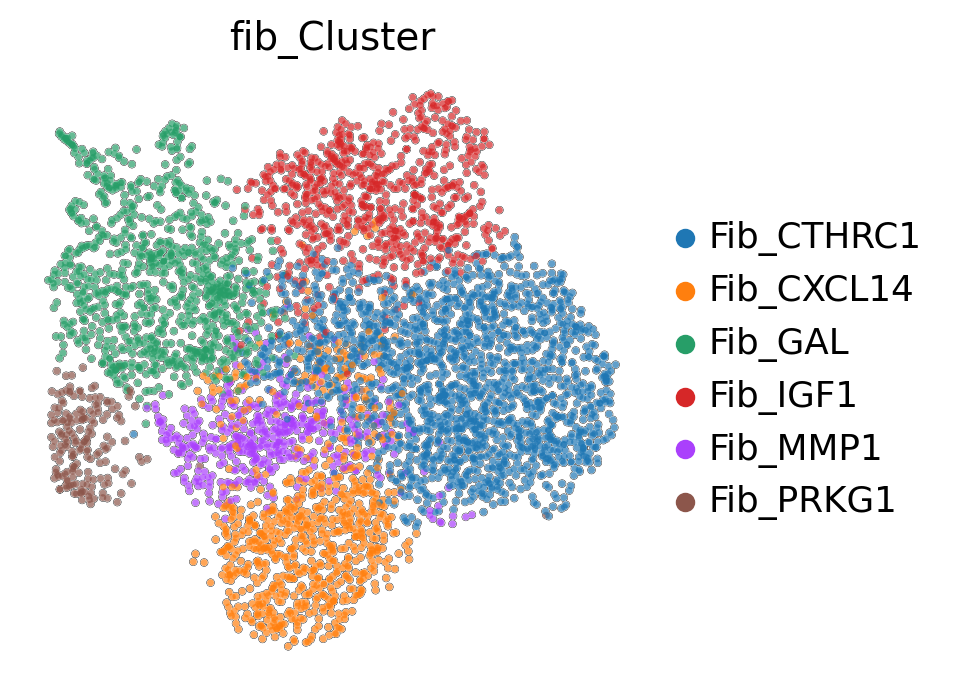

In [11]:
from io import StringIO
import pandas as pd

labeled(adata_fib,cluster_names=new_stro_names,reference_key='leiden',cell_type_key='fib_Cluster')
sc.pl.umap(adata_fib,color='fib_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05),
           save='fib_type1_total.pdf')

## 分组

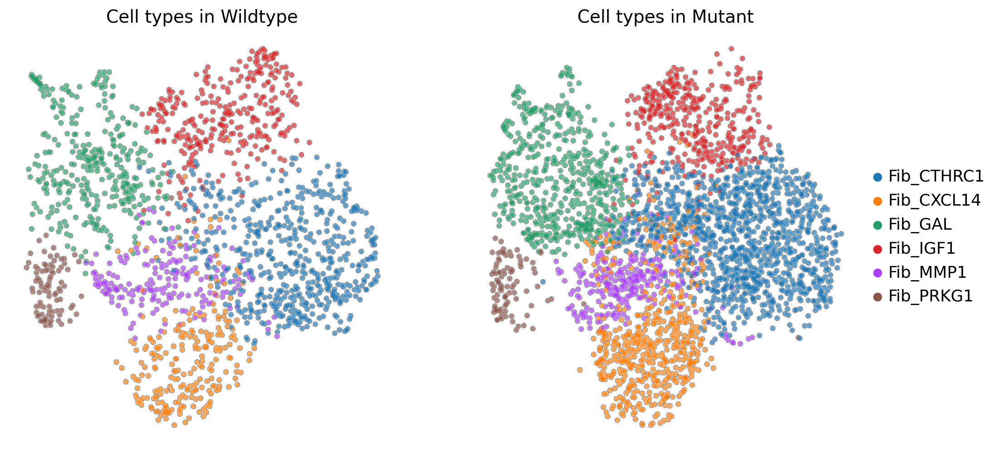

In [11]:
import scanpy as sc
import matplotlib.pyplot as plt
adata_fib_con = adata_fib[adata_fib.obs['KRAS'] == 'Wildtype']
adata_fib_exp = adata_fib[adata_fib.obs['KRAS'] == 'Mutant']
#创建一个画板分为两个轴
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
sc.pl.umap(adata_fib_con, color=['fib_Cluster'],size=50,
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), use_raw=True, ax=ax1, show=False,title='Cell types in Wildtype')

sc.pl.umap(adata_fib_exp, color=['fib_Cluster'],size=50,
           legend_loc='right margin', add_outline=True,
           outline_width=(0.05, 0.05), frameon=False, use_raw=True, ax=ax2, show=False,title='Cell types in Mutant')
# 保存图片,bbox_inches='tight' 用于在保存图像时自动调整边界框以确保图像的所有内容都包含在内。
plt.savefig(name+"combined_umap2.pdf", dpi=300, bbox_inches='tight')
plt.show()

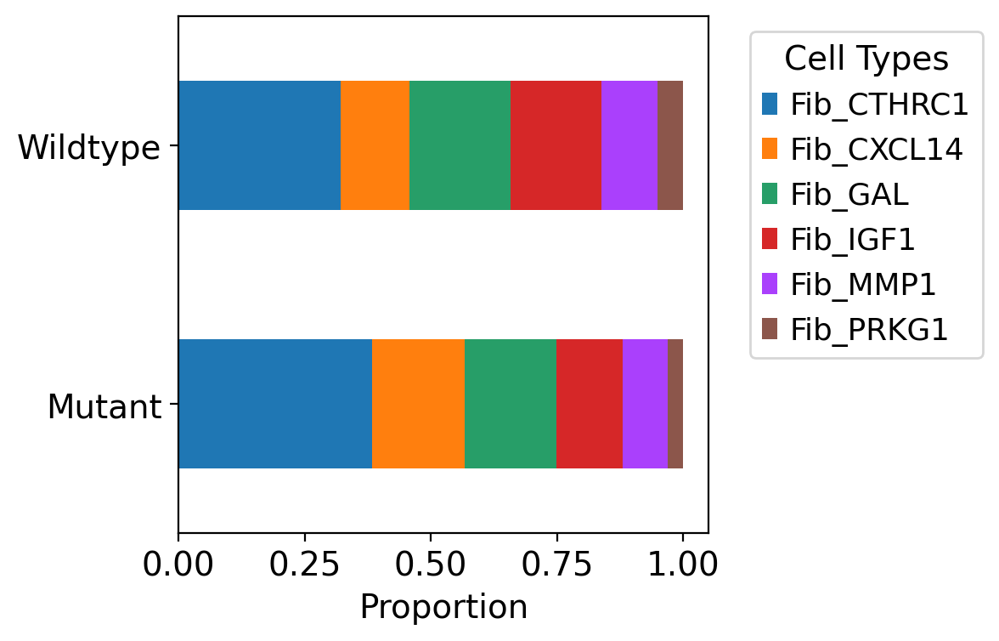

In [131]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_fib_stro提取数据
Group = adata_fib.obs['KRAS']
fib_Cluster = adata_fib.obs['fib_Cluster']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'fib_Cluster': fib_Cluster})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'fib_Cluster']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)   #h去掉就是垂直的
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)
# 显示图形
plt.savefig(name+'fibcellproportion.pdf', dpi=300, bbox_inches='tight')
plt.show()
# 导出比例到Excel
excel_filename = name + "fib_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
grouped_ratios.to_csv(name + "fib_cellproportion.csv") #用于柱状图

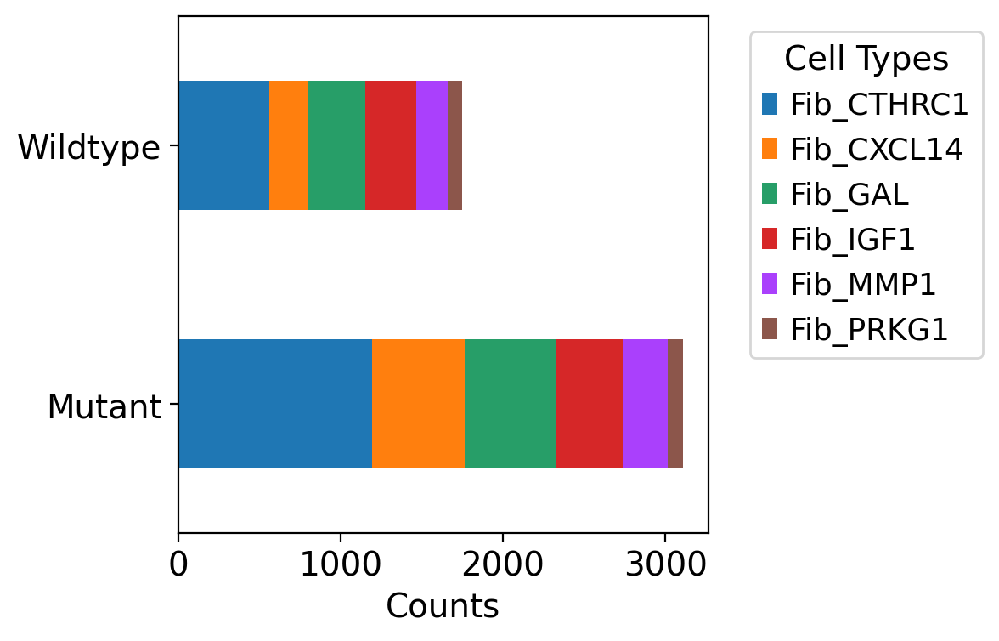

In [132]:
# 绘制条形图
ax = grouped_counts.plot(kind='barh', stacked=True)
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Counts')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig(name+'fib_cellcounts.pdf', dpi=300, bbox_inches='tight')
plt.show()

# 导出绝对数量到Excel
excel_filename = name + "fib_cellcounts.xlsx"  # 根据变量name动态生成文件名
grouped_counts.to_excel(excel_filename)

## 定位 name

In [ ]:
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/2.Scanpy/ZJH_KRAS_myel_"

In [ ]:
adata_myel.write(name+'afterumap.h5ad',compression='gzip')
adata_myel.obs.to_csv(name+"afterumap_obs_infor.csv",index=True)

In [15]:
adata_myel=sc.read_h5ad(name+"afterumap.h5ad")
adata_myel

AnnData object with n_obs × n_vars = 13348 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Celltype_colors', 'KRAS_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


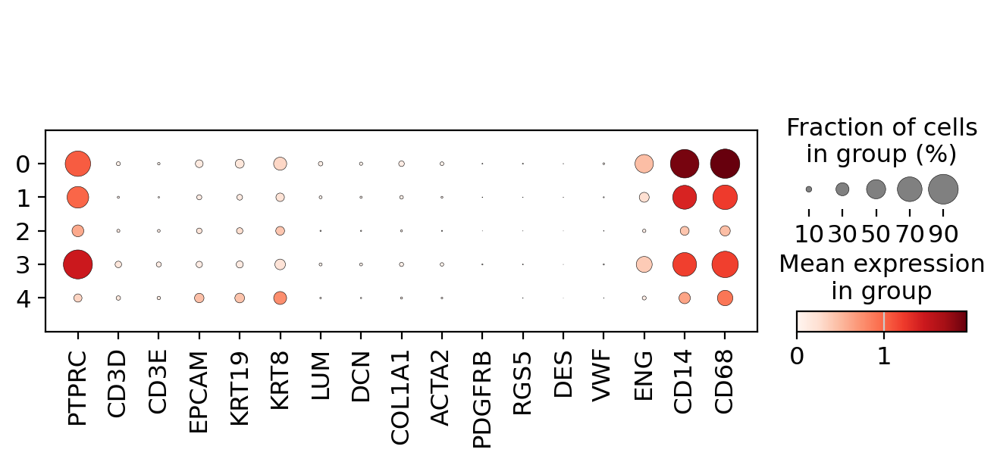

In [142]:
markers=['PTPRC','CD3D',"CD3E",'EPCAM','KRT19','KRT8','LUM','DCN','COL1A1','ACTA2','PDGFRB','RGS5','DES', 'VWF','ENG','CD14','CD68']
sc.pl.dotplot(adata_myel, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=False, dot_min=0,save='myel_leiden_allmarker2.pdf')

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


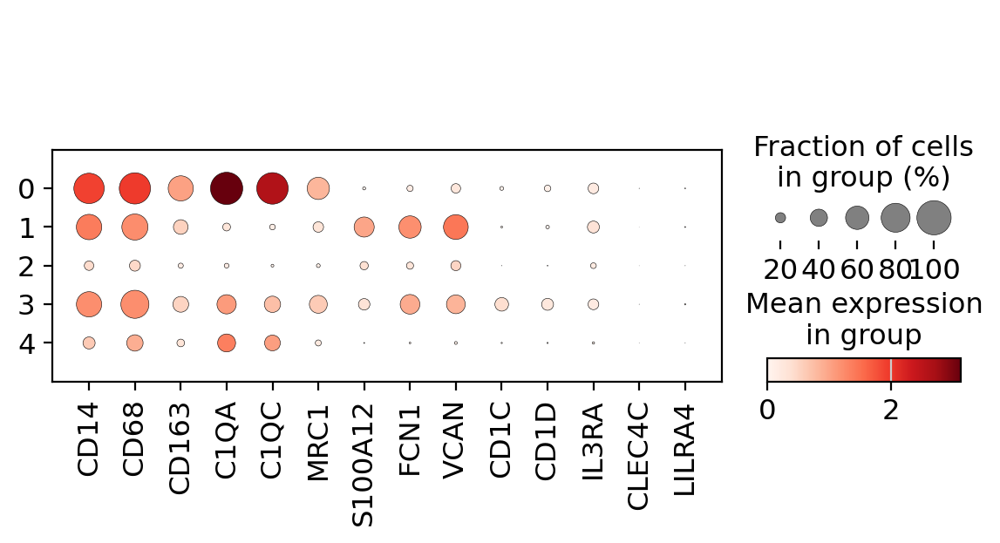

In [147]:
markers = ['CD14', 'CD68',  # All Myeloid_cells
          'CD163','C1QA','C1QC','MRC1',# Macrophages
          'S100A12', 'FCN1','VCAN', # Monocytes
          'CD1C','CD1D',#cDC
          'IL3RA','CLEC4C','LILRA4' # pDC
          ]
sc.pl.dotplot(adata_myel, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=False, dot_min=0,save='myel_leiden_allmarker.pdf')

## myel亚群注释

In [26]:
new_stro_names ='''
0,Macro_C1QC
1,Mono_S100A8
2,Mono_MALAT1
3,DCs
4,Macro_TNFRSF17
'''

In [27]:
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'Celltype', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


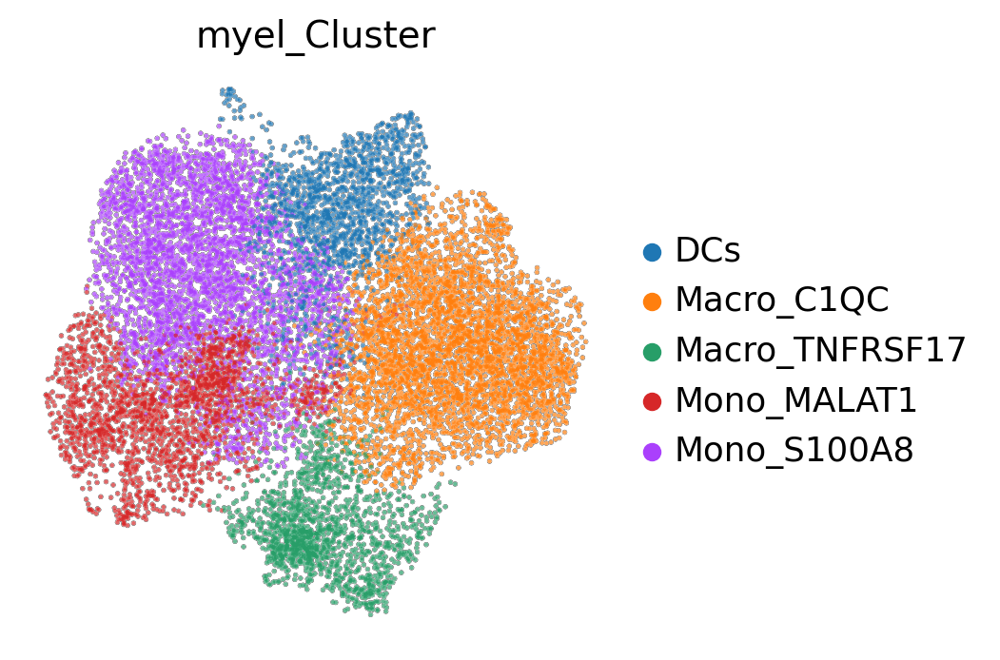

In [28]:
from io import StringIO
import pandas as pd

labeled(adata_myel,cluster_names=new_stro_names,reference_key='leiden',cell_type_key='myel_Cluster')
sc.pl.umap(adata_myel,color='myel_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05),size=10,
           save='myel_type1_total.pdf')

## 分组

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


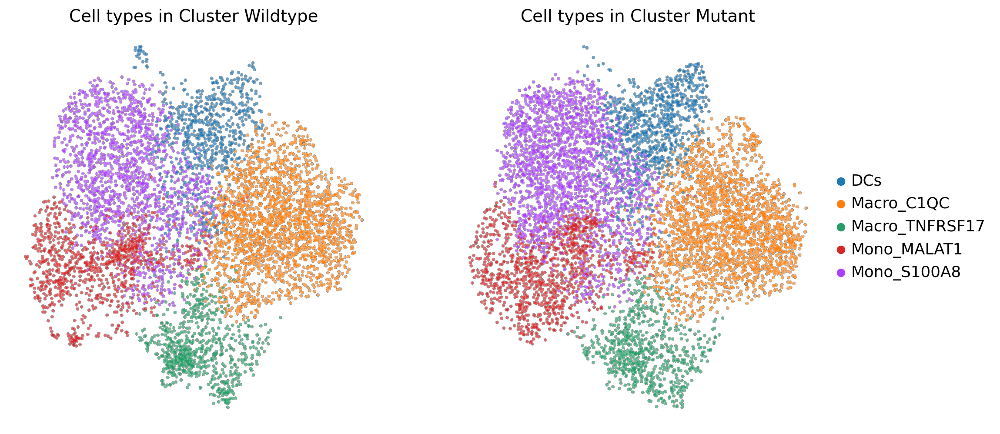

In [51]:
import scanpy as sc
import matplotlib.pyplot as plt
adata_myel_con = adata_myel[adata_myel.obs['KRAS'] == 'Wildtype']
adata_myel_exp = adata_myel[adata_myel.obs['KRAS'] == 'Mutant']
#创建一个画板分为两个轴
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
sc.pl.umap(adata_myel_con, color=['myel_Cluster'],size=20,
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), use_raw=True, ax=ax1, show=False,title='Cell types in Cluster Wildtype')

sc.pl.umap(adata_myel_exp, color=['myel_Cluster'],size=20,
           legend_loc='right margin', add_outline=True,
           outline_width=(0.05, 0.05), frameon=False, use_raw=True, ax=ax2, show=False,title='Cell types in Cluster Mutant')
# 保存图片,bbox_inches='tight' 用于在保存图像时自动调整边界框以确保图像的所有内容都包含在内。
plt.savefig(name+"combined_umap.pdf", dpi=300, bbox_inches='tight')
plt.show()

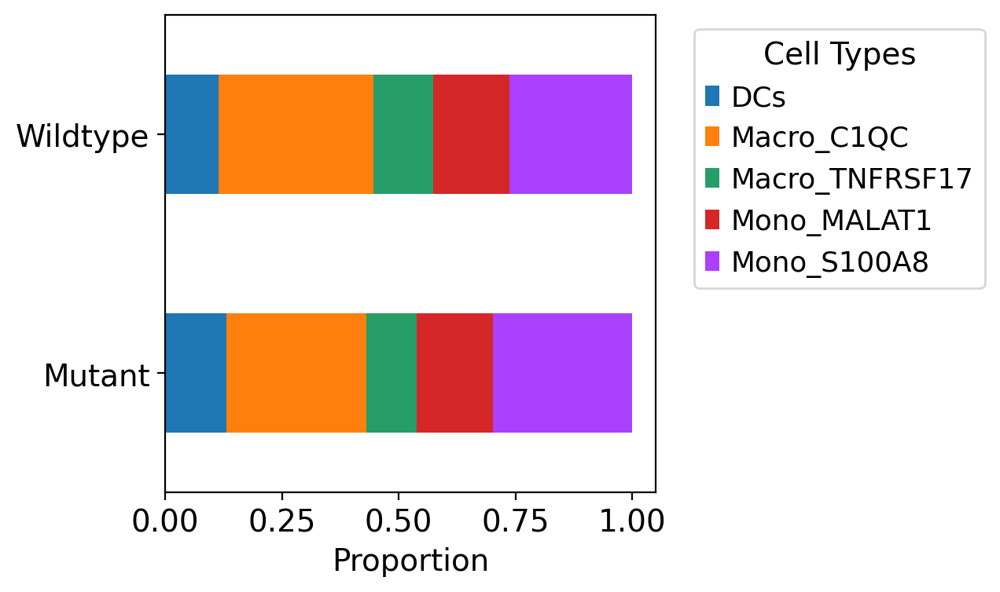

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_myel_stro提取数据
Group = adata_myel.obs['KRAS']
myel_Cluster = adata_myel.obs['myel_Cluster']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'myel_Cluster': myel_Cluster})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'myel_Cluster']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)   #h去掉就是垂直的
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)
# 显示图形
plt.savefig(name+'myelcellproportion.pdf', dpi=300, bbox_inches='tight')
plt.show()
# 导出比例到Excel
excel_filename = name + "myel_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
grouped_ratios.to_csv(name + "myel_cellproportion.csv") #用于柱状图

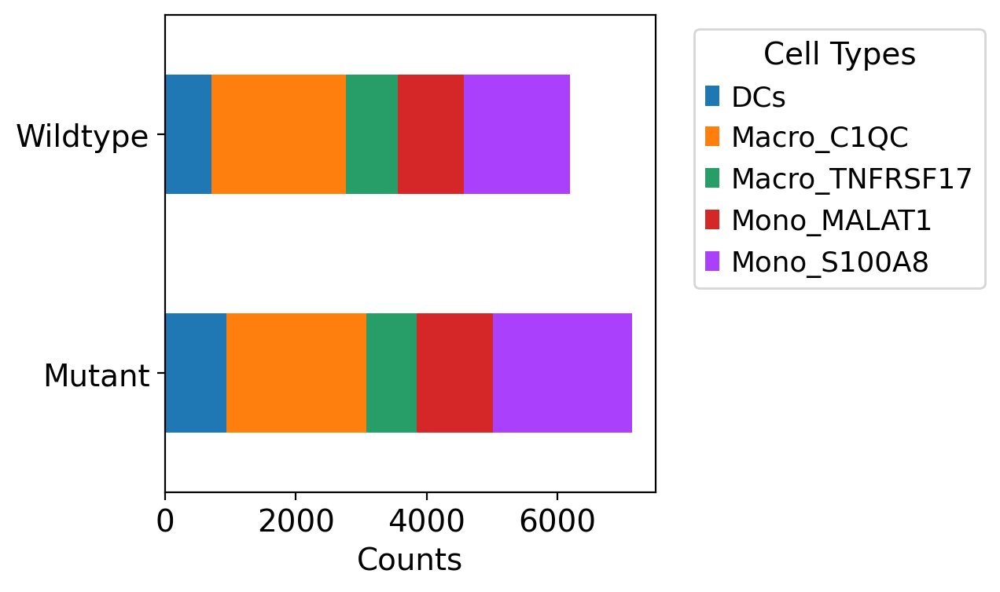

In [53]:
# 绘制条形图
ax = grouped_counts.plot(kind='barh', stacked=True)
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Counts')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig(name+'myel_cellcounts.pdf', dpi=300, bbox_inches='tight')
plt.show()

# 导出绝对数量到Excel
excel_filename = name + "myel_cellcounts.xlsx"  # 根据变量name动态生成文件名
grouped_counts.to_excel(excel_filename)

In [205]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_stro提取数据
Group = adata_myel.obs['sample']
myel_Cluster = adata_myel.obs['myel_Cluster']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'myel_Cluster': myel_Cluster})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'myel_Cluster']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 导出比例到Excel
excel_filename = name + "allsample_myel_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
excel_filename = name + "allsample_myel_cellcounts.xlsx"  # 根据变量name动态生成文件名
grouped_counts.to_excel(excel_filename)


# epi细胞分类

In [178]:
adata_epi=adata[adata.obs['Celltype'].isin(['Epithelial_cells'])]
adata_epi

View of AnnData object with n_obs × n_vars = 47710 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'sample_colors', 'KRAS_colors', 'Celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [179]:
number=837368
sc.pp.neighbors(adata_epi, n_neighbors=15, n_pcs=50, knn=True,random_state=number)
sc.tl.leiden(adata_epi, resolution=0.5,random_state=number)
sc.tl.umap(adata_epi,random_state=number)
adata_epi

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:39)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


AnnData object with n_obs × n_vars = 47710 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'sample_colors', 'KRAS_colors', 'Celltype_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


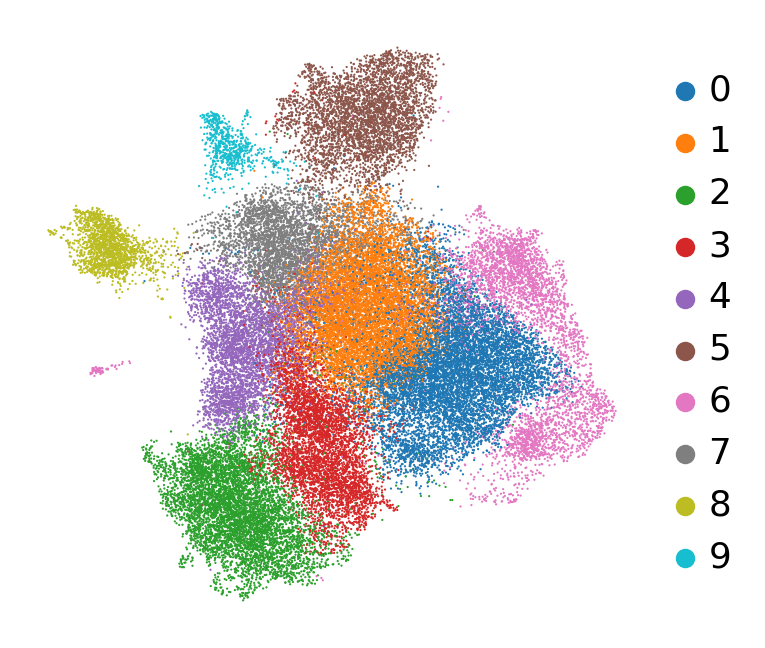

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


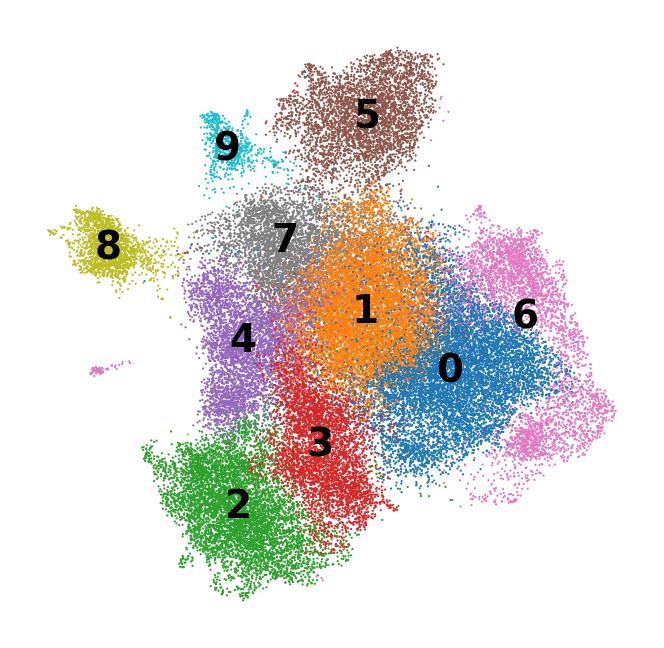

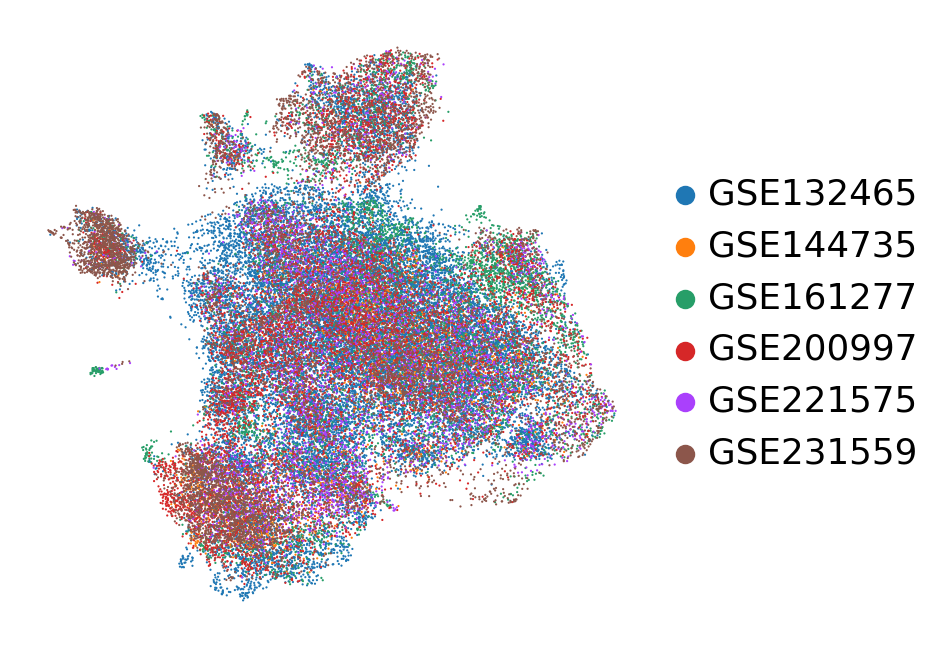

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


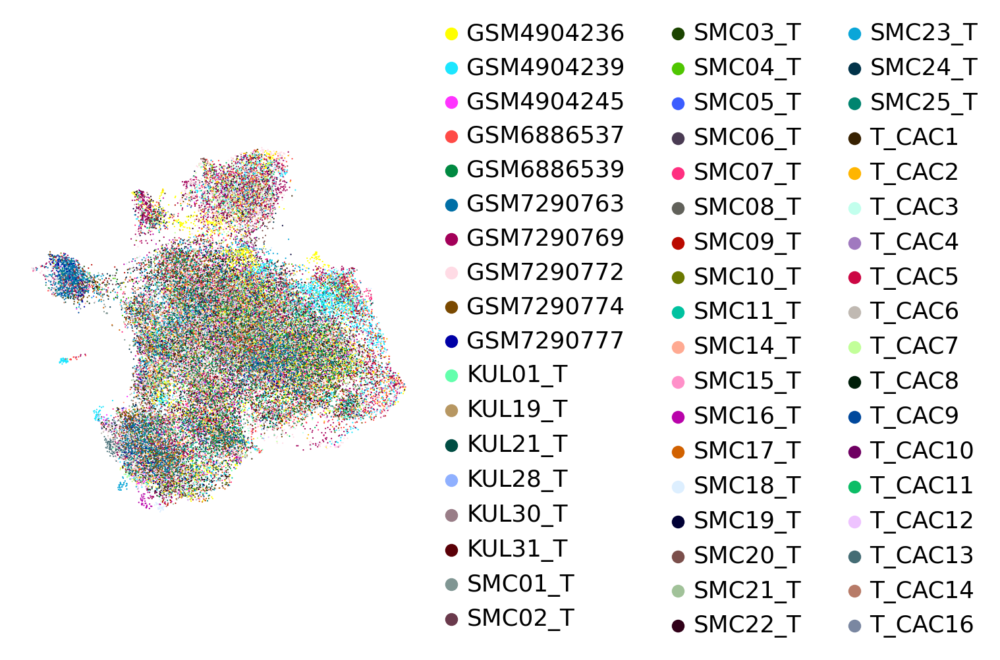

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


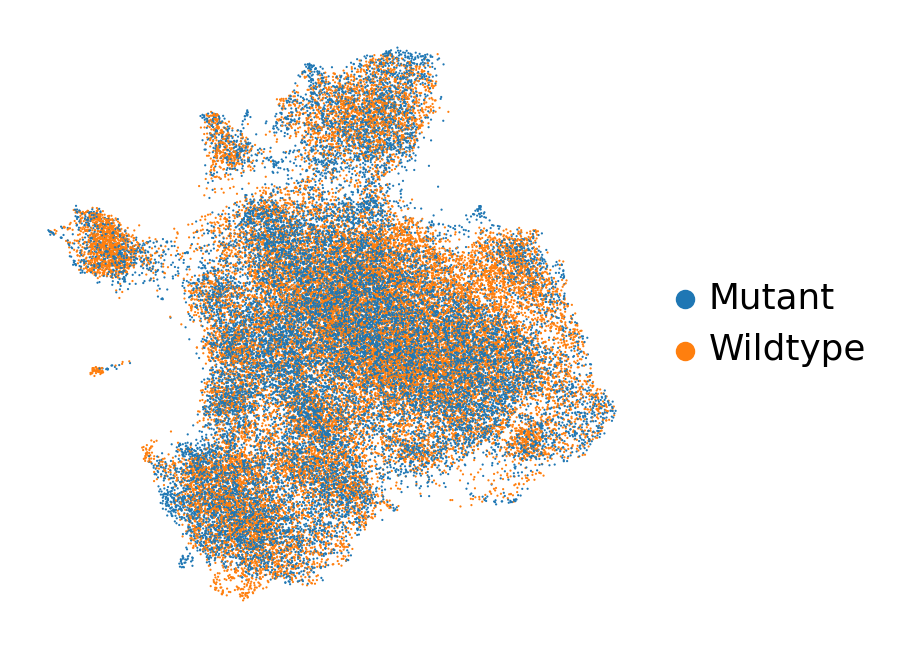

In [182]:
sc.pl.umap(adata_epi,color=['leiden'], legend_loc='right margin', frameon=False, title='',palette='tab10', use_raw=True ,save='_leiden_epi.pdf')
sc.pl.umap(adata_epi, color=['leiden'], legend_loc='on data', frameon=False, title='', use_raw=True)
sc.pl.umap(adata_epi,color=['batch'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='_batch_epi.pdf')
sc.pl.umap(adata_epi,color=['sample'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='_batch_epi.pdf')
sc.pl.umap(adata_epi,color=['KRAS'], legend_loc='right margin', frameon=False, title='', use_raw=True, save='_Cluster_epi.pdf')

## 定位 name

In [2]:
name="/mnt/g/E-disk/ZJH_KRAS/Workdir/2.Scanpy/ZJH_KRAS_epi_"

In [12]:
adata_epi.write(name+'afterumap.h5ad',compression='gzip')

In [177]:
adata_epi=sc.read_h5ad(name+"afterumap.h5ad")
adata_epi

AnnData object with n_obs × n_vars = 13348 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Celltype_colors', 'KRAS_colors', 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


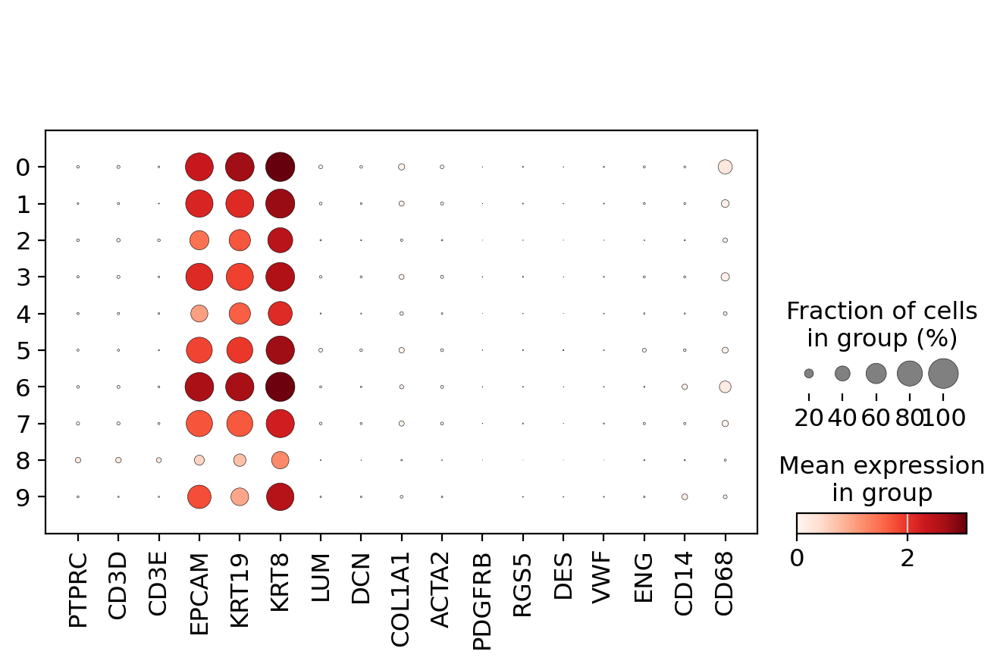

In [184]:
markers=['PTPRC','CD3D',"CD3E",'EPCAM','KRT19','KRT8','LUM','DCN','COL1A1','ACTA2','PDGFRB','RGS5','DES', 'VWF','ENG','CD14','CD68']
sc.pl.dotplot(adata_epi, var_names=markers, groupby='leiden', use_raw=True, var_group_rotation=0, vmin=0, swap_axes=False, dot_min=0,save='epi_leiden_allmarker2.pdf')

## epi亚群注释

In [185]:
new_stro_names ='''
0,Epi_01
1,Epi_02
2,Epi_03
3,Epi_04
4,Epi_05
5,Epi_06
6,Epi_07
7,Epi_08
8,Epi_09
9,Epi_10
'''

In [186]:
def labeled(
  adata: sc.AnnData, 
  cluster_names: str, 
  reference_key: str, 
  cell_type_key: str = 'Celltype', 
  inplace: bool = True
  ):
  _adata = adata if inplace else adata.copy()
  _ref_df = _adata.obs.loc[:, [reference_key]]
  _annot_df = pd.read_csv(StringIO(cluster_names), header=None, dtype='object')
  _adata.obs[cell_type_key] = pd.merge(
    _ref_df, _annot_df, left_on=reference_key, right_on=0, how='left')[1].values
  return None if inplace else _adata

/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/yqcj/miniconda3/envs/scrublet/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


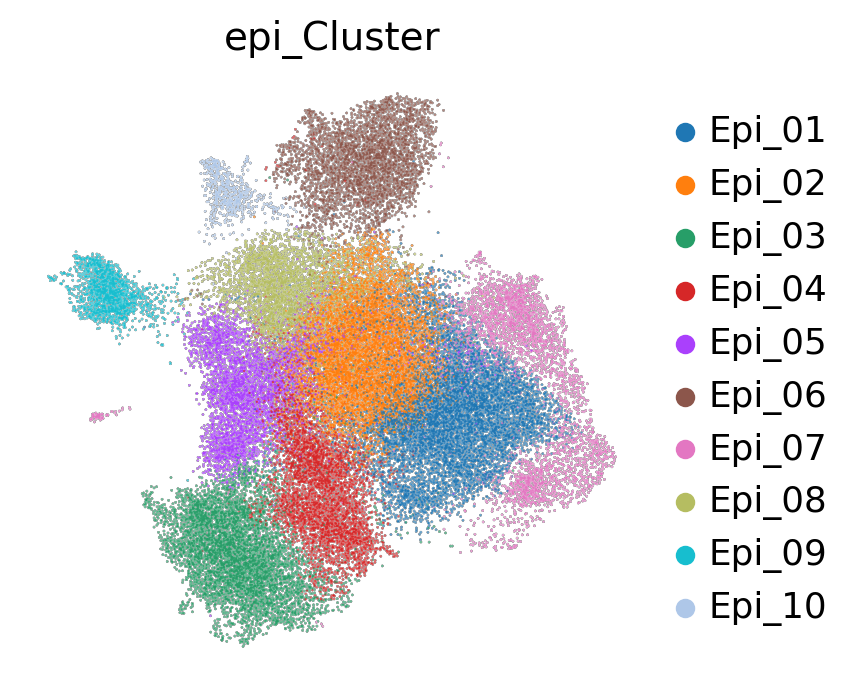

In [187]:
from io import StringIO
import pandas as pd

labeled(adata_epi,cluster_names=new_stro_names,reference_key='leiden',cell_type_key='epi_Cluster')
sc.pl.umap(adata_epi,color='epi_Cluster',frameon=False, add_outline=True,
           outline_width=(0.05, 0.05),
           save='epi_type1_total.pdf')

In [188]:
adata_epi.obs['KRAS'].value_counts()

Wildtype    25946
Mutant      21764
Name: KRAS, dtype: int64

## 分组

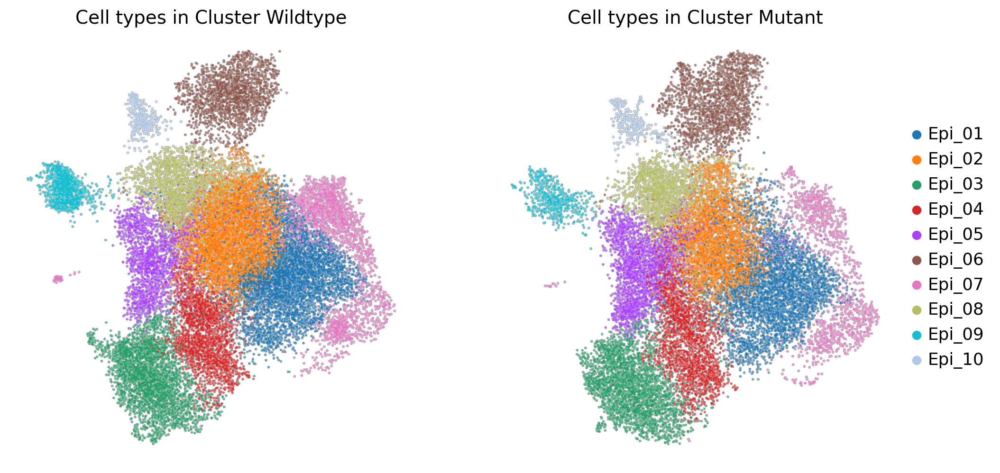

In [6]:
import scanpy as sc
import matplotlib.pyplot as plt
adata_epi_con = adata_epi[adata_epi.obs['KRAS'] == 'Wildtype']
adata_epi_exp = adata_epi[adata_epi.obs['KRAS'] == 'Mutant']
#创建一个画板分为两个轴
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6))
sc.pl.umap(adata_epi_con, color=['epi_Cluster'],size=10,
           legend_loc='', frameon=False, add_outline=True,
           outline_width=(0.05, 0.05), use_raw=True, ax=ax1, show=False,title='Cell types in Cluster Wildtype')

sc.pl.umap(adata_epi_exp, color=['epi_Cluster'],size=10,
           legend_loc='right margin', add_outline=True,
           outline_width=(0.05, 0.05), frameon=False, use_raw=True, ax=ax2, show=False,title='Cell types in Cluster Mutant')
# 保存图片,bbox_inches='tight' 用于在保存图像时自动调整边界框以确保图像的所有内容都包含在内。
plt.savefig(name+"combined_umap.pdf", dpi=300, bbox_inches='tight')
plt.show()

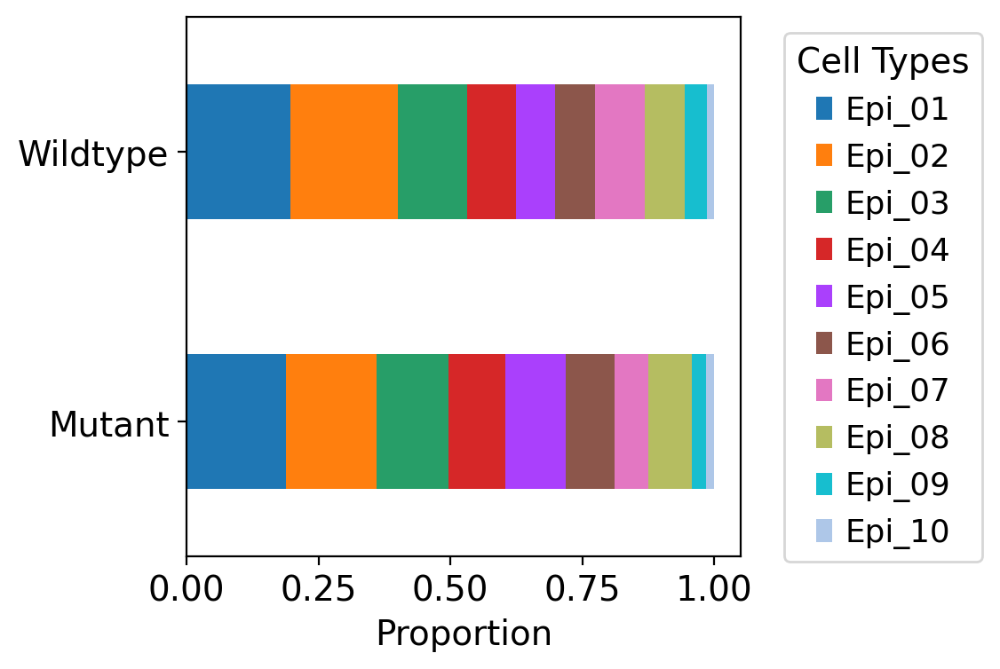

In [190]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_epi_stro提取数据
Group = adata_epi.obs['KRAS']
epi_Cluster = adata_epi.obs['epi_Cluster']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'epi_Cluster': epi_Cluster})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'epi_Cluster']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 绘制条形图
ax = grouped_ratios.plot.barh(stacked=True)   #h去掉就是垂直的
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Proportion')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)
# 显示图形
plt.savefig(name+'epicellproportion.pdf', dpi=300, bbox_inches='tight')
plt.show()
# 导出比例到Excel
excel_filename = name + "epi_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
grouped_ratios.to_csv(name + "epi_cellproportion.csv") #用于柱状图

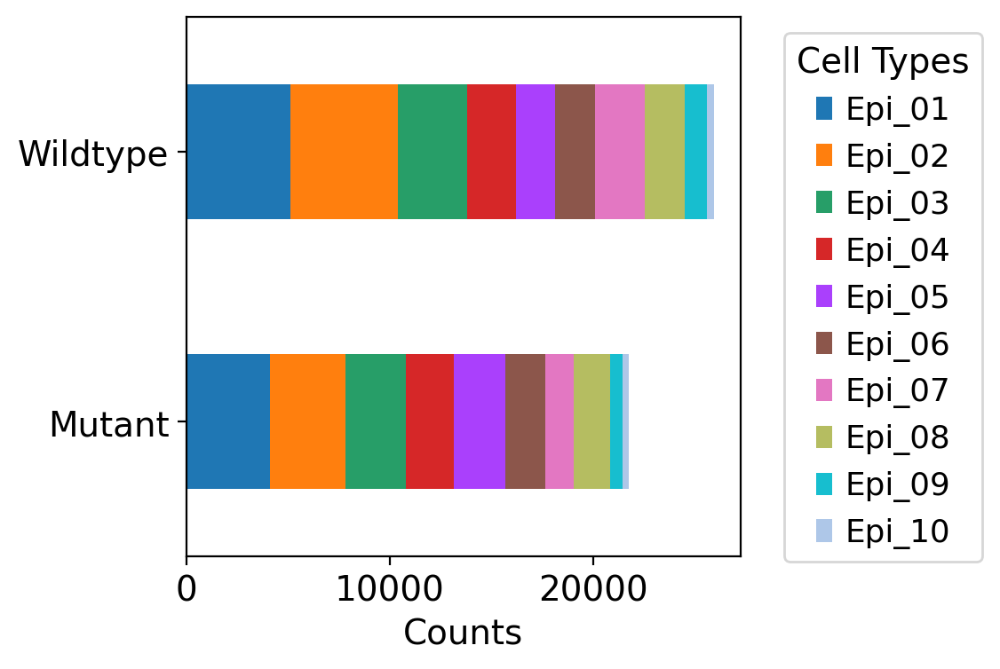

In [191]:
# 绘制条形图
ax = grouped_counts.plot(kind='barh', stacked=True)
# 设置图例和轴标签
ax.legend(title='Cell Types', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_xlabel('Counts')
ax.set_ylabel('')
# 去掉网格
ax.grid(False)

# 显示图形
plt.savefig(name+'epi_cellcounts.pdf', dpi=300, bbox_inches='tight')
plt.show()

# 导出绝对数量到Excel
excel_filename = name + "epi_cellcounts.xlsx"  # 根据变量name动态生成文件名
grouped_counts.to_excel(excel_filename)

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
# 从adata_stro提取数据
Group = adata_epi.obs['sample']
epi_Cluster = adata_epi.obs['epi_Cluster']
# 创建DataFrame
df = pd.DataFrame({'Group': Group, 'epi_Cluster': epi_Cluster})
# 计算每组中每种细胞类型的数量
grouped_counts = df.groupby(['Group', 'epi_Cluster']).size().unstack(fill_value=0)
# 计算每组中每种细胞类型的比例
grouped_ratios = grouped_counts.div(grouped_counts.sum(axis=1), axis=0)
# 导出比例到Excel
excel_filename = name + "allsample_epi_cellproportion.xlsx"  # 根据变量name动态生成文件名
grouped_ratios.to_excel(excel_filename)
excel_filename = name + "allsample_epi_cellcounts.xlsx"  # 根据变量name动态生成文件名
grouped_counts.to_excel(excel_filename)


In [192]:
adata_epi.write(name+"aftercelltype.h5ad",compression='gzip')
adata_epi.obs.to_csv(name+"aftercelltype_obs_infor.csv",index=True)

In [38]:
adata_epi=sc.read(name+"aftercelltype.h5ad")
adata_epi

AnnData object with n_obs × n_vars = 47710 × 5000
    obs: 'predicted_doublets', 'batch', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rp', 'pct_counts_rp', 'leiden', 'KRAS', 'Celltype', 'epi_Cluster'
    var: 'n_cells', 'mt', 'rp', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Celltype_colors', 'KRAS_colors', 'batch_colors', 'epi_Cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## 通路分析

In [31]:
import scanpy as sc
# 假设 adata_sub2 是您预处理过的 AnnData 对象
# 加载您的 Hallmark gmt 文件并将其解析为字典，其中键是通路名称，值是基因列表
# 假设您有一个名为 load_gmt 的函数来执行此操作
def load_gmt(filename):
    # 打开文件并读取所有行
    with open(filename, 'r') as f:
        lines = f.readlines()
    hallmark_dict = {}
    # 遍历每一行
    for line in lines:
        # 将行分成多个部分
        parts = line.strip().split('\t')
        # 第一部分是通路名称
        pathway = parts[0]
        # 剩下的部分是基因列表
        genes = parts[1:]
        # 将通路名称和基因列表添加到字典中
        hallmark_dict[pathway] = genes
    return hallmark_dict

# 调用 load_gmt 函数，加载并解析 Hallmark gmt 文件
hallmark_dict = load_gmt("/mnt/f/YS_LM/Workdir/2.Scanpy_0/Cancersea.gmt")
# 遍历字典中的每个通路
for pathway in hallmark_dict:
    # 获取当前通路的基因列表
    gene_list = hallmark_dict[pathway]
    # 计算这个通路的评分
    sc.tl.score_genes(adata_epi, gene_list=gene_list, score_name=pathway, use_raw=True)

computing score 'Angiogenesis'
    finished: added
    'Angiogenesis', score of gene set (adata.obs).
    1095 total control genes are used. (0:00:02)
computing score 'Apoptosis'
    finished: added
    'Apoptosis', score of gene set (adata.obs).
    993 total control genes are used. (0:00:02)
computing score 'Cell Cycle'
    finished: added
    'Cell Cycle', score of gene set (adata.obs).
    884 total control genes are used. (0:00:02)
computing score 'Differentiation'
    finished: added
    'Differentiation', score of gene set (adata.obs).
    1186 total control genes are used. (0:00:02)
computing score 'DNA damage'
    finished: added
    'DNA damage', score of gene set (adata.obs).
    987 total control genes are used. (0:00:02)
computing score 'DNA repair'
    finished: added
    'DNA repair', score of gene set (adata.obs).
    944 total control genes are used. (0:00:02)
computing score 'EMT'
    finished: added
    'EMT', score of gene set (adata.obs).
    1098 total control gen

In [35]:
import scanpy as sc
# 假设 adata_sub2 是您预处理过的 AnnData 对象
# 加载您的 Hallmark gmt 文件并将其解析为字典，其中键是通路名称，值是基因列表
# 假设您有一个名为 load_gmt 的函数来执行此操作
def load_gmt(filename):
    # 打开文件并读取所有行
    with open(filename, 'r') as f:
        lines = f.readlines()
    hallmark_dict = {}
    # 遍历每一行
    for line in lines:
        # 将行分成多个部分
        parts = line.strip().split('\t')
        # 第一部分是通路名称
        pathway = parts[0]
        # 从通路名称中移除 'HALLMARK_' 前缀
        pathway = pathway.replace('HALLMARK_', '')
        # 剩下的部分是基因列表
        genes = parts[1:]
        # 将通路名称和基因列表添加到字典中
        hallmark_dict[pathway] = genes
    return hallmark_dict

# 调用 load_gmt 函数，加载并解析 Hallmark gmt 文件
hallmark_dict = load_gmt("/mnt/f/YS_LM/Workdir/2.Scanpy_0/h.all.v2023.1.Hs.symbols.gmt")
# 遍历字典中的每个通路
for pathway in hallmark_dict:
    # 获取当前通路的基因列表
    gene_list = hallmark_dict[pathway]
    # 计算这个通路的评分
    sc.tl.score_genes(adata_epi, gene_list=gene_list, score_name=pathway, use_raw=True)

computing score 'TNFA_SIGNALING_VIA_NFKB'
    finished: added
    'TNFA_SIGNALING_VIA_NFKB', score of gene set (adata.obs).
    1130 total control genes are used. (0:00:02)
computing score 'HYPOXIA'
    finished: added
    'HYPOXIA', score of gene set (adata.obs).
    1186 total control genes are used. (0:00:02)
computing score 'CHOLESTEROL_HOMEOSTASIS'
    finished: added
    'CHOLESTEROL_HOMEOSTASIS', score of gene set (adata.obs).
    941 total control genes are used. (0:00:02)
computing score 'MITOTIC_SPINDLE'
    finished: added
    'MITOTIC_SPINDLE', score of gene set (adata.obs).
    941 total control genes are used. (0:00:02)
computing score 'WNT_BETA_CATENIN_SIGNALING'
    finished: added
    'WNT_BETA_CATENIN_SIGNALING', score of gene set (adata.obs).
    898 total control genes are used. (0:00:01)
computing score 'TGF_BETA_SIGNALING'
    finished: added
    'TGF_BETA_SIGNALING', score of gene set (adata.obs).
    846 total control genes are used. (0:00:02)
computing score 'I

    finished: added
    'UNFOLDED_PROTEIN_RESPONSE', score of gene set (adata.obs).
    844 total control genes are used. (0:00:02)
computing score 'PI3K_AKT_MTOR_SIGNALING'
    finished: added
    'PI3K_AKT_MTOR_SIGNALING', score of gene set (adata.obs).
    1042 total control genes are used. (0:00:02)
computing score 'MTORC1_SIGNALING'
    finished: added
    'MTORC1_SIGNALING', score of gene set (adata.obs).
    1034 total control genes are used. (0:00:02)
computing score 'E2F_TARGETS'
    finished: added
    'E2F_TARGETS', score of gene set (adata.obs).
    883 total control genes are used. (0:00:02)
computing score 'MYC_TARGETS_V1'
    finished: added
    'MYC_TARGETS_V1', score of gene set (adata.obs).
    732 total control genes are used. (0:00:02)
computing score 'MYC_TARGETS_V2'
    finished: added
    'MYC_TARGETS_V2', score of gene set (adata.obs).
    797 total control genes are used. (0:00:02)
computing score 'EPITHELIAL_MESENCHYMAL_TRANSITION'
    finished: added
    'EPI

    finished: added
    'ALLOGRAFT_REJECTION', score of gene set (adata.obs).
    1186 total control genes are used. (0:00:02)
computing score 'SPERMATOGENESIS'
    finished: added
    'SPERMATOGENESIS', score of gene set (adata.obs).
    1190 total control genes are used. (0:00:02)
computing score 'KRAS_SIGNALING_UP'
    finished: added
    'KRAS_SIGNALING_UP', score of gene set (adata.obs).
    1185 total control genes are used. (0:00:02)
computing score 'KRAS_SIGNALING_DN'
    finished: added
    'KRAS_SIGNALING_DN', score of gene set (adata.obs).
    1190 total control genes are used. (0:00:02)
computing score 'PANCREAS_BETA_CELLS'
    finished: added
    'PANCREAS_BETA_CELLS', score of gene set (adata.obs).
    848 total control genes are used. (0:00:01)


In [ ]:
# 合并 'Epi_Cluster' 和 'KRAS' 列，创建新的 'Epi_Cluster' 列
adata_epi.obs['Epi_Group'] = adata_epi.obs['epi_Cluster'].astype(str) + '_' + adata_epi.obs['KRAS'].astype(str)

In [4]:
ordered_categories = ['Epi_01_Wildtype', 'Epi_01_Mutant', 
                      'Epi_02_Wildtype', 'Epi_02_Mutant',
                      'Epi_03_Wildtype', 'Epi_03_Mutant',
                      'Epi_04_Wildtype', 'Epi_04_Mutant',
                      'Epi_05_Wildtype', 'Epi_05_Mutant',
                      'Epi_06_Wildtype', 'Epi_06_Mutant',
                      'Epi_07_Wildtype', 'Epi_07_Mutant',
                      'Epi_08_Wildtype', 'Epi_08_Mutant',
                      'Epi_09_Wildtype', 'Epi_09_Mutant',
                      'Epi_10_Wildtype', 'Epi_10_Mutant',
                     ]
#ordered_categories = [f'Epi_{i:02d}_{type}' for i in range(1, 5) for type in ['Wildtype', 'Mutant']]
# 将新的 'Epi_Kras' 列设置为有序类别，并按照定义的顺序排序
adata_epi.obs['Epi_Group'] = pd.Categorical(adata_epi.obs['Epi_Group'], categories=ordered_categories, ordered=True)

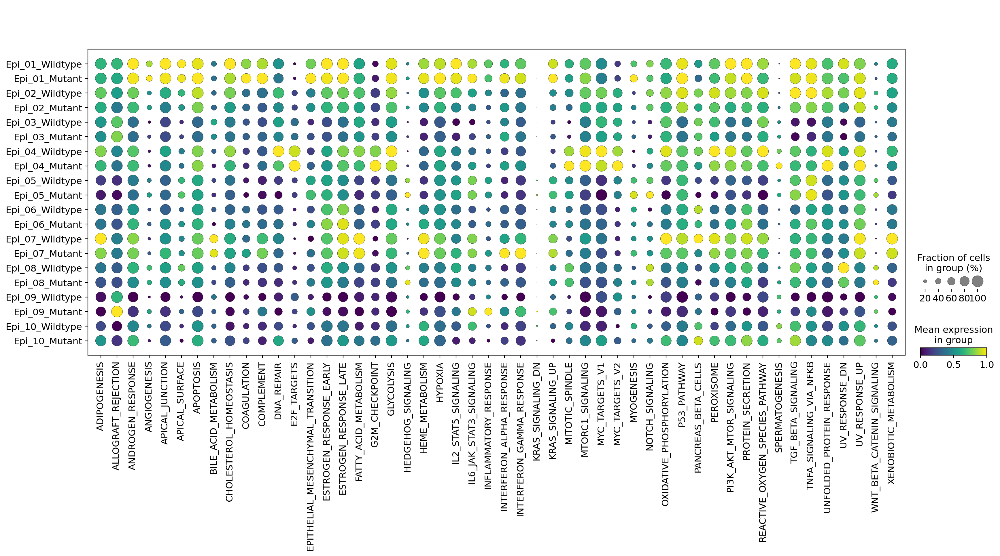

In [5]:
sc.pl.dotplot(adata_epi, var_names=['ADIPOGENESIS', 'ALLOGRAFT_REJECTION', 'ANDROGEN_RESPONSE', 'ANGIOGENESIS', 'APICAL_JUNCTION', 'APICAL_SURFACE', 'APOPTOSIS', 'BILE_ACID_METABOLISM', 'CHOLESTEROL_HOMEOSTASIS', 'COAGULATION', 'COMPLEMENT', 'DNA_REPAIR', 'E2F_TARGETS', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'ESTROGEN_RESPONSE_EARLY', 'ESTROGEN_RESPONSE_LATE', 'FATTY_ACID_METABOLISM', 'G2M_CHECKPOINT', 'GLYCOLYSIS', 'HEDGEHOG_SIGNALING', 'HEME_METABOLISM', 'HYPOXIA', 'IL2_STAT5_SIGNALING', 'IL6_JAK_STAT3_SIGNALING', 'INFLAMMATORY_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'INTERFERON_GAMMA_RESPONSE', 'KRAS_SIGNALING_DN', 'KRAS_SIGNALING_UP', 'MITOTIC_SPINDLE', 'MTORC1_SIGNALING', 'MYC_TARGETS_V1', 'MYC_TARGETS_V2', 'MYOGENESIS', 'NOTCH_SIGNALING', 'OXIDATIVE_PHOSPHORYLATION', 'P53_PATHWAY', 'PANCREAS_BETA_CELLS', 'PEROXISOME', 'PI3K_AKT_MTOR_SIGNALING', 'PROTEIN_SECRETION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'SPERMATOGENESIS', 'TGF_BETA_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'UV_RESPONSE_DN', 'UV_RESPONSE_UP', 'WNT_BETA_CATENIN_SIGNALING', 'XENOBIOTIC_METABOLISM'], groupby='Epi_Group', use_raw=True, dendrogram=False,cmap='viridis', standard_scale="var" ,swap_axes=False, save='epi_hallmarks2.pdf')